# Entrega 2 - Clasificación de Vinos


In [1]:
from sklearn.datasets import load_wine
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

# Discriminantes:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB


En esta entrega trabajaremos sobre la base de datos de vinos creada por R. A. Fisher. Esta base de datos viene por default en los conjuntos de datos de `sklearn`, con lo cual les dejaré lista la importación de los datos, para que trabajemos sobre la misma base

In [2]:
dataset = load_wine()
X = dataset['data']
clases = dataset['target']
colnames = ['Alcohol','Malic acid','Ash','Alcalinity of ash','Magnesium',
            'Total phenols','Flavanoids','Nonflavanoid phenols','Proanthocyanins',
            'Color intensity','Hue','OD280/OD315 of diluted wines','Proline']
df_X = pd.DataFrame(X,columns=colnames)
df_X

# Creo una base de datos que tenga el target incluido
df = pd.DataFrame(X,columns=colnames)

# Using DataFrame.insert() to add a column
df.insert(2, "Target", clases, True)

In [3]:
clases

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

## 1 - a.) ¿Cuántas variables se midieron para cada vino? ¿Cuántas clases de vino existen en la base de datos?

In [4]:
# Cuantas variables se midieron para cada vino
print("Dimenciones:",df_X.shape)
print("Columnas:",df_X.columns)
n_elts = len(set(clases))
print("Cantidad de clases",n_elts)

Dimenciones: (178, 13)
Columnas: Index(['Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash', 'Magnesium',
       'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue',
       'OD280/OD315 of diluted wines', 'Proline'],
      dtype='object')
Cantidad de clases 3


Podemos ver que la base de datos cuenta con 178 observaciones de distintos vinos, para los cuales se midieron 13 variables distintas. La cantidad de clases de vinos presentes son 3.

## 1-b.) Utilice pandas o seaborn para realizar un análisis exploratorio y descriptivo para comprender en qué consiste la base de datos. Explaye su respuesta escribiendo en celdas markdown.

Profe cometi el error de pensar que la variable target no existia porque no me di cuenta que estaba cargado en una array distinto al de la base de datos, no entiendo porque hacen eso en muchos casos, yo siempre estoy acostumbrado a tener la variable de interes en la misma base de datos y no en algo separado. Como consecuencia de ello hice un analisis sin tener en cuenta la variable de clasificacion, no lo voy a borrar porque me sirve ver lo que hice, pero mas abajo voy a hacer un analisis teniendo en cuenta el target.    

#### Analizis exploratorio sin tener en cuenta target:

In [4]:
# Descriptivo
print(df_X.isnull().sum())
print(df_X.dtypes)
df_X.describe()

Alcohol                         0
Malic acid                      0
Ash                             0
Alcalinity of ash               0
Magnesium                       0
Total phenols                   0
Flavanoids                      0
Nonflavanoid phenols            0
Proanthocyanins                 0
Color intensity                 0
Hue                             0
OD280/OD315 of diluted wines    0
Proline                         0
dtype: int64
Alcohol                         float64
Malic acid                      float64
Ash                             float64
Alcalinity of ash               float64
Magnesium                       float64
Total phenols                   float64
Flavanoids                      float64
Nonflavanoid phenols            float64
Proanthocyanins                 float64
Color intensity                 float64
Hue                             float64
OD280/OD315 of diluted wines    float64
Proline                         float64
dtype: object


,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


Todas las variables observadas son del tipo numericas continuas. La base de datos no cuenta con valores ausentes. 
A partir del analisis decriptivo podemos destacar:
Los valores para la variable proline son mayores que para las demas variables, esto es como consecuencia de que su escala tiene un mayor orden de magnitud y como consecuecia de esto muesta mayores valores de los estadisticos calculados. 

Comparando media y mediana puedo decir que practicamente todas las variables tienden a una distribucion normal.
Me queda la duda para las variabels color intensity, malic acid y proline, las cuales voy a proceder a verificar graficamente. 

array([[<AxesSubplot:title={'center':'Proline'}>]], dtype=object)

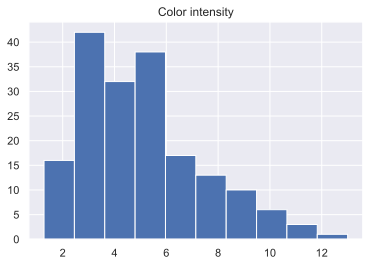

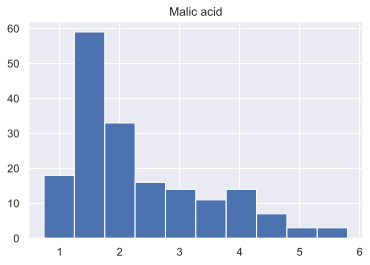

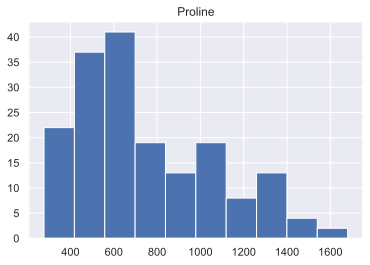

In [92]:
#plt.subplot(1,3,1)
df_X[["Color intensity"]].hist()
#plt.subplot(1,3,2)
df_X[["Malic acid"]].hist()
#plt.subplot(1,3,3)
df_X[["Proline"]].hist()


En las variables que me quedaban dudas sobre su distribucion podemos notar una asimetria derecha importante, pero es solo un analisis descriptivo, para afirmar que no tienen distribucion normal, habria que hacer alguna prueba formal.

<AxesSubplot:>

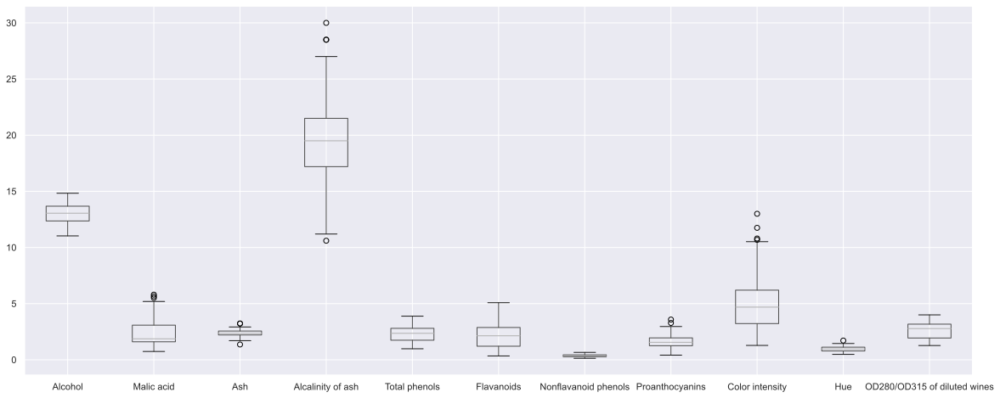

In [62]:
plt.figure(figsize=(20,8))
# Saco las variables con mayor escala para que se puedan apreciar los demas boxplots sin problemas.
df_X.drop(columns=['Proline', 'Magnesium']).boxplot()


<AxesSubplot:>

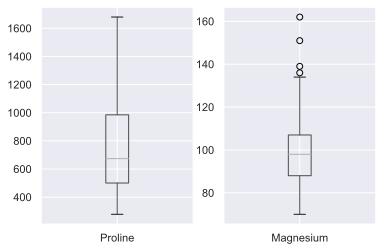

In [93]:
#df_X[['Proline', 'Magnesium']].boxplot()
plt.subplot(1,2,1)
df_X[['Proline']].boxplot()
plt.subplot(1,2,2)
df_X[['Magnesium']].boxplot()

A partir de los boxplots se pueden observar algunos valores atipicos, que se encuentran fuera de los bigotes. Estos valores pueden ser los causantes de generar la diferencia existente entre media y mediana para alguna de las variables. 

#### Analisis exploratorio teniendo en cuenta target:

In [202]:
for i in df_X.columns:
    print(df[["Target",i]].groupby("Target").describe())

       Alcohol                                                           
         count       mean       std    min     25%     50%     75%    max
Target                                                                   
0         59.0  13.744746  0.462125  12.85  13.400  13.750  14.100  14.83
1         71.0  12.278732  0.537964  11.03  11.915  12.290  12.515  13.86
2         48.0  13.153750  0.530241  12.20  12.805  13.165  13.505  14.34
       Malic acid                                                       
            count      mean       std   min     25%    50%     75%   max
Target                                                                  
0            59.0  2.010678  0.688549  1.35  1.6650  1.770  1.9350  4.04
1            71.0  1.932676  1.015569  0.74  1.2700  1.610  2.1450  5.80
2            48.0  3.333750  1.087906  1.24  2.5875  3.265  3.9575  5.65
         Ash                                                     
       count      mean       std   min    25%   50% 

A partir del analisis descriptivo podemos apreciar los estadisticos mas importantes para las distintas clases de la variable respuesta en cada una de los variables medidas (predictores).

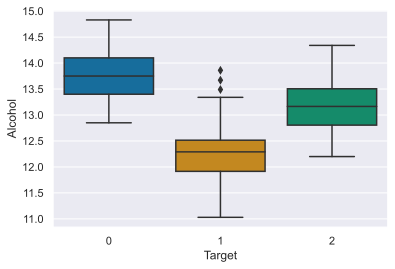

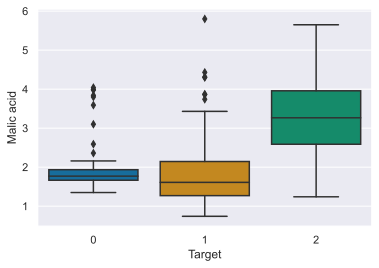

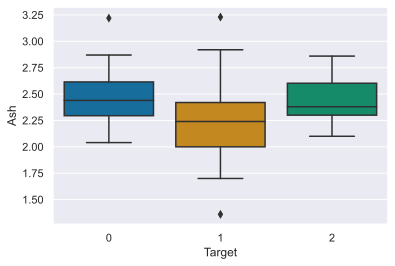

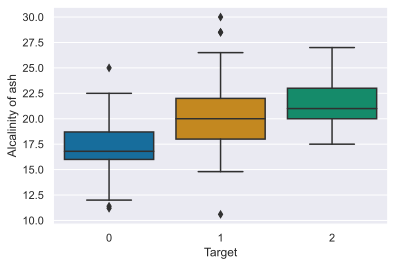

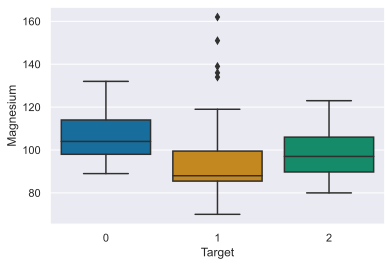

...

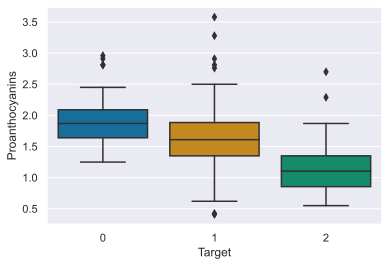

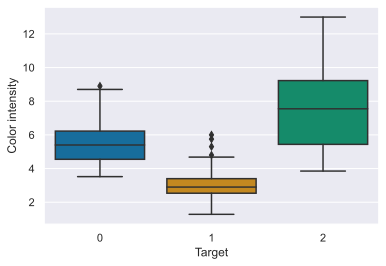

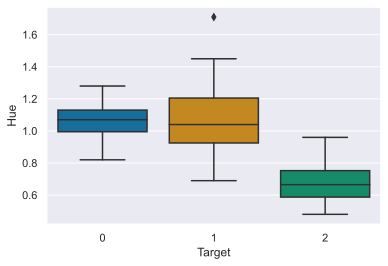

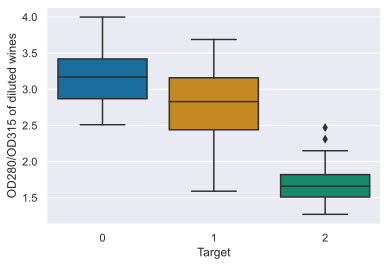

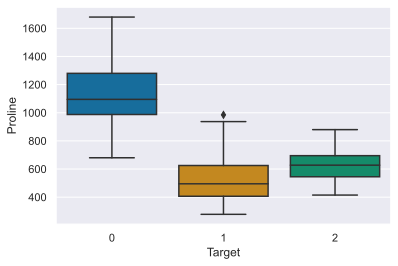

In [185]:
for i in df_X.columns:
    plt.figure(i)
    sns.boxplot(y= i , 
                x= "Target", 
                data= df , 
                palette="colorblind")





## Alchool
Los mayores valores se dan para la clase 0, seguida de la calse 2 y finalmente la clase 1.
El desvio estandar es bastante similar entre ellos

## Malic acid
El mayor contenido se produce para la clase 2, seguida por la clase 1 y finalmente la clase 0, con el menor desvio estandard.

## Ash
Los contenidos de ash son aproximadamente similares entre las distintas clases de vinos.

## Alcalinity of ash
La alcalinidad de la ceniza es mayor en la case 2, seguida por la 1 y finalmente la 0.

## Magnesium
El mayor contenido se encuentra en la clase 0, seguida por la 2 y finalmente la 1. 

## Total phenols
El mayor contenido se encuentra en la clase 0, seguida por la 1 y finalmente la 2. 

## Flavonoids
El mayor contenido se encuentra en la clase 0, seguida por la 1 y finalmente la 2. 

## Non flavonoids phenols
El mayor contenido se encuentra en la clase 2, seguida por la 1 y finalmente la 0. 

## Proanthocyanins
El mayor contenido se encuentra en la clase 0, seguida por la 1 y finalmente la 2. 

## Color intensity
La clase dos posee color mas alto y el desvio estandar es el mayor. Luego sigue la clase 0 y finalmente la 1.

## Hue                       
El mayor contenido se encuentra en la clase 0, seguida por la 1 y finalmente la 2.

## OD280/OD315 of diluted wines   
El mayor contenido se encuentra en la clase 0, seguida por la 1 y finalmente la 2.

## Proline                       
El mayor contenido se encuentra en la clase 0, seguida por la 2 y finalmente la 1.


## 2.) Realice un análisis de componentes principales utilizando el paquete `sklearn`. Utilice los datos estandarizados para el análisis. Mantenga las primeras 6 componentes principales.

In [5]:
# Preprocesado y modelado
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale

In [6]:
# Entrenamiento modelo PCA con escalado de los datos
pca_pipe = make_pipeline(StandardScaler(), PCA(n_components=6))
pca_pipe.fit(df_X)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

Como consecuencia de las distintas unidades de medida o escalas de las distintas variables es muy importante realizar la estandarizacion de los datos para luego realizar el analisis de pca y que las interpretaciones no se vean sesgadas como consecuencia de ello.


In [7]:
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = df_X.columns,
    index   = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6']
)

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
PC1,0.144329,-0.245188,-0.002051,-0.239320,0.141992,0.394661,0.422934,-0.298533,0.313429,-0.088617,0.296715,0.376167,0.286752
PC2,-0.483652,-0.224931,-0.316069,0.010591,-0.299634,-0.065040,0.003360,-0.028779,-0.039302,-0.529996,0.279235,0.164496,-0.364903
PC3,-0.207383,0.089013,0.626224,0.612080,0.130757,0.146179,0.150682,0.170368,0.149454,-0.137306,0.085222,0.166005,-0.126746
PC4,-0.017856,0.536890,-0.214176,0.060859,-0.351797,0.198068,0.152295,-0.203301,0.399057,0.065926,-0.427771,0.184121,-0.232071
PC5,-0.265664,0.035214,-0.143025,0.066103,0.727049,-0.149318,-0.109026,-0.500703,0.136860,-0.076437,-0.173615,-0.101161,-0.157869
PC6,-0.213539,-0.536814,-0.154475,0.100825,-0.038144,0.084122,0.018920,0.258594,0.533795,0.418644,-0.105983,-0.265851,-0.119726


A partir de la tabla se puede observar que en la primer componente principal, es decir la que explica mayor porcentaje de varianza las variables mas inlfuyentes o de mayor peso en orden descendente son: Flavanoids, Total phenols, OD280/OD315 of diluted wines, Proanthocyanins, Nonflavanoid phenols, Hue, Proline y todas las demas exepto Color intensity y Ash. En el caso se la primer componente principal son muchas las variables del set de datos original que toman importancia o peso para poder explicar la variabilidad en esa direccion. 

Que haya variables que no sean importantes o "pesadas" para la primera componente principal no quiere decir que no sean relevantes, si no que no ayudan a explicar la variabilidad en esa direccion pero probablemente sean importantes para explicar la variabilidad en otra direccion como por ejemplo: Ash es la variable de mayor relevancia para la tercera componente principal y Color intensity	lo es para la segunda componente principal. Por otra parte Magnesium de bajo peso en la primera componente es la pricipal en la quinta componente y Alcohol es muy importante en la segunda. 

## 2-b.) Grafique mediante un gráfico de barras el *porcentaje* de variabilidad explicado por cada una de las seis primeras componentes principales (recuerde que los autovalores de la matriz de covarianza representan la varianza explicada por cada componente y se pueden obtener con el método `pca.explained_variance_ratio`). Calcule el porcentaje de variabilidad explicada por las primeras dos componentes principales.

----------------------------------------------------
Porcentaje de varianza explicada por cada componente
[0.36198848 0.1920749  0.11123631 0.0706903  0.06563294 0.04935823]
----------------------------------------------------
 
----------------------------------------------------
Porcentaje de varianza explicada por las primeras dos componentes
0.5540633835693527
----------------------------------------------------


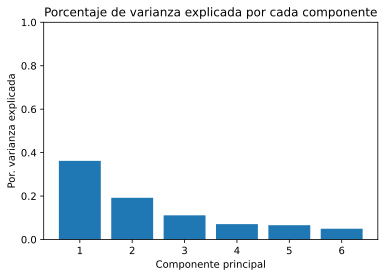

In [9]:
import numpy as np

print('----------------------------------------------------')
print('Porcentaje de varianza explicada por cada componente')
print(modelo_pca.explained_variance_ratio_)
print('----------------------------------------------------')
print(" ")
print('----------------------------------------------------')
print('Porcentaje de varianza explicada por las primeras dos componentes')
print(modelo_pca.explained_variance_ratio_[[0,1]].sum())
print('----------------------------------------------------')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.bar(
    x      = np.arange(modelo_pca.n_components_) + 1,
    height = modelo_pca.explained_variance_ratio_
)

ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_ylim(0, 1)
ax.set_title('Porcentaje de varianza explicada por cada componente')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza explicada');


Podemos ver que las primeras dos componentes explican el 55% del total de la varianza de la base de datos.

## 3.) Proyecte los datos sobre las dos primeras componentes principales y grafique el resultado, coloreando cada dato con su respectiva clase de vino. 

Porcentaje de varianza explicada por las primeras dos componentes
0.5540633835693527


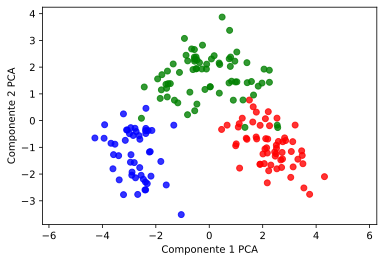

In [8]:
import matplotlib
import matplotlib.pyplot as plt

# Entrenamiento modelo PCA con escalado de los datos
pca_pipe = make_pipeline(StandardScaler(), PCA(n_components=2))
pca_pipe.fit(df_X)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']
X_pca = modelo_pca.transform(StandardScaler().fit_transform(df_X))

print('Porcentaje de varianza explicada por las primeras dos componentes')
print(modelo_pca.explained_variance_ratio_.sum())

# Reproyectamos los datos con la información de la componente 1 al espacio original.
#X_new = modelo_pca.inverse_transform(X_pca)
colors = ['red','green','blue']
plt.scatter(x=X_pca[:, 0], y=X_pca[:, 1], c=clases, alpha=0.8, cmap=matplotlib.colors.ListedColormap(colors))
plt.xlabel('Componente 1 PCA') # agregamos nombre al eje abscisas
plt.ylabel('Componente 2 PCA') # agregamos nombre al eje ordenadas
plt.axis('equal'); # definimos que el aspecto del gráfico sea igual para cada eje.

Se puede apreciar que las componentes permiten separar las clases de manera muy satisfactoria.

## 4.) Nos quedemos únicamente con estas dos componentes principales (Reducción de dimensión del problema). 

## 4-a.) Plantee los tres clasificadores vistos en clase para discriminar las especies de vino en el plano de las dos primeras componentes y discuta, según su criterio, cuál es el más conveniente en este caso.

In [19]:
# Proyección de las observaciones de entrenamiento
# ==============================================================================
proyecciones = pca_pipe.transform(X=df_X)
proyecciones = pd.DataFrame(
    proyecciones,
    columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'],
    index   = df_X.index
)
proyecciones.shape
proyecciones.head()
proyecciones=proyecciones[["PC1","PC2"]]

### Análisis Discriminante Lineal (LDA)

In [49]:
LDA = LinearDiscriminantAnalysis()
discriminante1 = LDA.fit(proyecciones, clases)

plt.figure()
plt.scatter(proyecciones[["PC1"]],proyecciones[["PC2"]], c=clases)

x1_min, x1_max = plt.xlim()
x2_min, x2_max = plt.ylim()

h=0.1
xx, yy = np.meshgrid(np.arange(x1_min, x1_max, h),
                     np.arange(x2_min, x2_max, h))

Z = LDA.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z1 = Z[:, 1].reshape(xx.shape)
Z2 = Z[:, 2].reshape(xx.shape)

plt.pcolormesh(xx, yy, Z1, zorder=0, alpha=0.2, shading='auto')
plt.pcolormesh(xx, yy, Z2, zorder=0, alpha=0.2, shading='auto')
plt.contour(xx, yy, Z1, [0.5], colors='red')
plt.contour(xx, yy, Z2, [0.5], colors='red')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Análisis Discriminante Lineal')
plt.show()


### Análisis Discriminante Cuadrático

In [50]:
QDA = QuadraticDiscriminantAnalysis()
discriminante2 = QDA.fit(proyecciones, clases)

plt.figure()
plt.scatter(proyecciones[["PC1"]],proyecciones[["PC2"]], c=clases)

x1_min, x1_max = plt.xlim()
x2_min, x2_max = plt.ylim()

h=0.1
xx, yy = np.meshgrid(np.arange(x1_min, x1_max, h),
                     np.arange(x2_min, x2_max, h))

Z = QDA.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z1 = Z[:, 1].reshape(xx.shape)
Z2 = Z[:, 2].reshape(xx.shape)

plt.pcolormesh(xx, yy, Z1, zorder=0, alpha=0.2, shading='auto')
plt.pcolormesh(xx, yy, Z2, zorder=0, alpha=0.2, shading='auto')
plt.contour(xx, yy, Z1, [0.5], colors='red')
plt.contour(xx, yy, Z2, [0.5], colors='red')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Análisis Discriminante Lineal')
plt.show()

### Clasificación bayesiana gaussiana (Gaussian Naive Bayes)

In [51]:
NB = GaussianNB()
discriminante3 = NB.fit(proyecciones, clases)

plt.figure()
plt.scatter(proyecciones[["PC1"]],proyecciones[["PC2"]], c=clases)

x1_min, x1_max = plt.xlim()
x2_min, x2_max = plt.ylim()

h=0.1
xx, yy = np.meshgrid(np.arange(x1_min, x1_max, h),
                     np.arange(x2_min, x2_max, h))

Z = NB.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z1 = Z[:, 1].reshape(xx.shape)
Z2 = Z[:, 2].reshape(xx.shape)

plt.pcolormesh(xx, yy, Z1, zorder=0, alpha=0.2, shading='auto')
plt.pcolormesh(xx, yy, Z2, zorder=0, alpha=0.2, shading='auto')
plt.contour(xx, yy, Z1, [0.5], colors='red')
plt.contour(xx, yy, Z2, [0.5], colors='red')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Análisis Discriminante Lineal')
plt.show()

A partir de los graficos podemos ver las lineas divisorias que plantea cada metodo, el discriminante lineal deja que desear debido a que no sigue la tendencia de los datos, mientras que el discriminante cuadratico y el de naive bayes si siguen esta tendencia.

Se me complico un poco para los graficos de cada uno de los clasificadores al necesitar colorear 3 zonas y agregar 2 contornos, hice lo que pude.

## 4-b.)  Programe una función que calcule la "Accuracy" o exactitud del clasificador ((nro. de clasificaciones correctas)/(nro. total de datos)), evitando usar métodos de sklearn. Compare la accuracy de cada uno de los métodos utilizados. Explaye sus conclusiones.

In [55]:
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

In [111]:
#metrics.accuracy_score(y_test, y_pred_LDA_default))

In [114]:
def acc(target,modelo,datos):
    predichos=modelo.predict(datos)
    cm = pd.crosstab(target, predichos, rownames=['Actual'], colnames=['Predicted'], margins=True)
    accuracy=((cm[0][0]+cm[1][1]+cm[2][2])/predichos.shape[0])
    print(accuracy)

print('Accuracy Score - LDA:') 
print(acc(clases,discriminante1,proyecciones))
print('Accuracy Score - QDA:')  
print(acc(clases,discriminante2,proyecciones))
print('Accuracy Score - NB:')
print(acc(clases,discriminante3,proyecciones))

Accuracy Score - LDA: 
0.9719101123595506
None
Accuracy Score - QDA: 
0.9662921348314607
None
Accuracy Score - NB: 
0.9662921348314607
None


Concluyo que el de mayor accuracy es el LDA.
Nose porque se imprime none al final.
Tube dificultades principalmente con los graficos de los discriminantes y algunas con la funcion accuracy, me hubiese gustado programarla para que se de cuenta sola cuantas clases habia en los datos y la calcule directamente para los casos que haya 2 clases, 3 clases, ... y no como la programe que solo funciona para cuando hay 3 casos, pero no logre hacerlo y lo simplifique a este caso. 